In [1]:
%cd ..

/home/eli/AnacondaProjects/epych


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import collections
import glob
import functools
import logging
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import quantities as pq

import epych
from epych.statistics import alignment

In [4]:
%matplotlib inline

In [5]:
logging.basicConfig(level=logging.INFO)

In [6]:
CONDITIONS = ["go_gloexp", "go_seqctl", "lo_gloexp", "lo_rndctl", "igo_seqctl"]
PRETRIAL_SECONDS = 0.5
POSTTRIAL_SECONDS = 0.5

In [7]:
NWB_SUBJECTS = glob.glob('/mnt/data/000253/sub-*/')

In [8]:
PILOT_FILES = []

In [9]:
NUM_TRIALS = 0
ODDBALL_ONSET = 0.
ODDBALL_OFFSET = 0.

In [10]:
evoked = {}

In [11]:
aligner = epych.statistics.alignment.AlignmentSummary.unpickle("/mnt/data/000253/visual_alignment")

In [12]:
def visual_align(signal):
    return signal.select_channels(["VIS" in loc for loc in signal.channels.location]).median_filter()

In [13]:
def samplings(cond):
    for s, subject_dir in enumerate(sorted(NWB_SUBJECTS)):
        subject = subject_dir.split('/')[-2]
        if not os.path.exists(subject_dir + "/" + cond):
            continue
        sampling = epych.recording.Sampling.unpickle(subject_dir + "/" + cond).smap(visual_align)
        global ODDBALL_ONSET
        global ODDBALL_OFFSET
        global NUM_TRIALS
        ODDBALL_ONSET += sampling.trials['stim3_start'].sum()
        ODDBALL_OFFSET += sampling.trials['stim3_end'].sum()
        NUM_TRIALS += len(sampling.trials)
        yield sampling
        del sampling
        logging.info("Loaded LFPs for %s in subject %s" % (cond, subject))

In [14]:
avgs = {cond: {} for cond in CONDITIONS}

In [15]:
for cond in CONDITIONS:
    avgs[cond] = epych.recording.EvokedSampling.unpickle("/mnt/data/000253/grandavg_%s" % cond)
    logging.info("Loaded grand-averaged LFPs for %s" % cond)

INFO:root:Loaded grand-averaged LFPs for go_gloexp
INFO:root:Loaded grand-averaged LFPs for go_seqctl
INFO:root:Loaded grand-averaged LFPs for lo_gloexp
INFO:root:Loaded grand-averaged LFPs for lo_rndctl
INFO:root:Loaded grand-averaged LFPs for igo_seqctl


In [16]:
summaries = {}

In [17]:
def initialize_grand_variance(cond, key, signal):
    area = os.path.commonprefix([loc for loc in signal.channels.location])
    return epych.statistics.grand.GrandVariance(aligner.stats[area], avgs[cond].signals[area])

In [18]:
for cond in CONDITIONS:
    summaries[cond] = epych.statistic.Summary(alignment.location_prefix, functools.partial(initialize_grand_variance, cond))
    summaries[cond].calculate(samplings(cond))
    summaries[cond].pickle("/mnt/data/mice_passiveglo_grandvariance_%s" % cond)
    logging.info("Calculated grand variance of LFPs for condition %s" % cond)

INFO:root:Loaded LFPs for go_gloexp in subject sub-621890
INFO:root:Loaded LFPs for go_gloexp in subject sub-632485
INFO:root:Loaded LFPs for go_gloexp in subject sub-632487
INFO:root:Loaded LFPs for go_gloexp in subject sub-637542
INFO:root:Loaded LFPs for go_gloexp in subject sub-637908
INFO:root:Loaded LFPs for go_gloexp in subject sub-637909
INFO:root:Loaded LFPs for go_gloexp in subject sub-640507
INFO:root:Calculated grand variance of LFPs for condition go_gloexp
INFO:root:Loaded LFPs for go_seqctl in subject sub-621890
INFO:root:Loaded LFPs for go_seqctl in subject sub-632485
INFO:root:Loaded LFPs for go_seqctl in subject sub-632487
INFO:root:Loaded LFPs for go_seqctl in subject sub-637542
INFO:root:Loaded LFPs for go_seqctl in subject sub-637908
INFO:root:Loaded LFPs for go_seqctl in subject sub-637909
INFO:root:Loaded LFPs for go_seqctl in subject sub-640507
INFO:root:Calculated grand variance of LFPs for condition go_seqctl
INFO:root:Loaded LFPs for lo_gloexp in subject sub-6

In [19]:
ODDBALL_ONSET /= NUM_TRIALS
ODDBALL_OFFSET /= NUM_TRIALS
events = {
    "Oddball Onset": (ODDBALL_ONSET, 'lightgreen'),
    "Oddball Offset": (ODDBALL_OFFSET, 'red'),
}

In [20]:
variances = {cond: {} for cond in CONDITIONS}

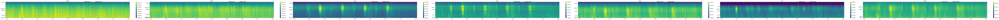

INFO:root:Plotted grand-variance LFPs for condition go_gloexp


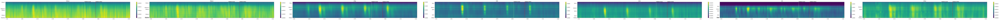

INFO:root:Plotted grand-variance LFPs for condition go_seqctl


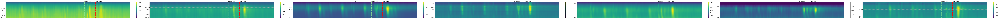

INFO:root:Plotted grand-variance LFPs for condition lo_gloexp


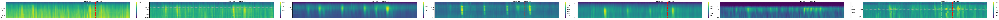

INFO:root:Plotted grand-variance LFPs for condition lo_rndctl


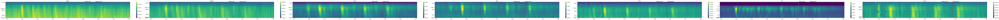

INFO:root:Plotted grand-variance LFPs for condition igo_seqctl


In [21]:
for cond in CONDITIONS:
    variances[cond] = epych.recording.EvokedSampling(epych.recording.empty_intervals(), epych.recording.empty_trials(), epych.recording.default_units(),
                                                     **{k: v.result() for k, v in summaries[cond].stats.items()})
    variances[cond].smap(lambda sig: sig.__class__(sig.channels, np.sqrt(sig.data), sig.dt, sig.times)).plot(vmin=0., figure="mice_passiveglo_visual_%s_lfp_variance.pdf" % cond, **events)
    logging.info("Plotted grand-variance LFPs for condition %s" % cond)